# Exploration

## Import Libraries

In [1]:
#Disable warnings
import warnings
warnings.filterwarnings("ignore")

#General libraries needed
import pandas as pd
import numpy as np

#Libraries for graphing
import matplotlib.pyplot as plt
import seaborn as sns

#Train, test, split
from sklearn.model_selection import train_test_split

#Library for statistical testing
from scipy import stats

#Imports for Telco Data
from explore import get_telco_data
from explore import prep_telco

#Imports for Exploring Data
from explore import plot_variable_pairs
from explore import months_to_years
from explore import plot_categorical_and_continuous_vars

#Imports for Zillow Data
from wrangle import wrangle_zillow
from prepare import add_scaled_columns

## Telco Dataset

### Acquire Data

In [2]:
df = get_telco_data()

In [3]:
df.head()

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service_type_id,online_security,...,streaming_movies,contract_type_id,paperless_billing,payment_type_id,monthly_charges,total_charges,churn,contract_type,internet_service_type,payment_type
0,0016-QLJIS,Female,0,Yes,Yes,65,Yes,Yes,1,Yes,...,Yes,3,Yes,2,90.45,5957.9,No,Two year,DSL,Mailed check
1,0017-DINOC,Male,0,No,No,54,No,No phone service,1,Yes,...,No,3,No,4,45.20,2460.55,No,Two year,DSL,Credit card (automatic)
2,0019-GFNTW,Female,0,No,No,56,No,No phone service,1,Yes,...,No,3,No,3,45.05,2560.1,No,Two year,DSL,Bank transfer (automatic)
3,0056-EPFBG,Male,0,Yes,Yes,20,No,No phone service,1,Yes,...,No,3,Yes,4,39.40,825.4,No,Two year,DSL,Credit card (automatic)
4,0078-XZMHT,Male,0,Yes,No,72,Yes,Yes,1,No,...,Yes,3,Yes,3,85.15,6316.2,No,Two year,DSL,Bank transfer (automatic)


### Prep Telco Data

In [4]:
train, validate, test = prep_telco(df)

In [5]:
train.head()

,customer_id,senior_citizen,tenure,internet_service_type_id,contract_type_id,payment_type_id,monthly_charges,total_charges,has_churned,paperless_billing_numeric,...,online_backup_No internet service,online_backup_Yes,device_protection_No internet service,device_protection_Yes,tech_support_No internet service,tech_support_Yes,streaming_tv_No internet service,streaming_tv_Yes,streaming_movies_No internet service,streaming_movies_Yes
5059,7718-RXDGG,0,15,2,1,3,68.6,1108.60,0,1,...,0,0,0,0,0,0,0,0,0,0
4865,6825-UYPFK,0,23,2,1,3,75.6,1758.60,1,0,...,0,0,0,0,0,0,0,0,0,0
6104,9135-HSWOC,0,64,3,3,3,19.7,1274.05,0,1,...,1,0,1,0,1,0,1,0,1,0
1618,3583-EKAPL,0,1,1,1,1,55.0,55.00,1,1,...,0,0,0,0,0,0,0,0,0,1
3131,5168-MQQCA,0,72,2,2,3,108.5,8003.80,0,1,...,0,1,0,1,0,1,0,1,0,1


In [6]:
small_train = train.head(1000)

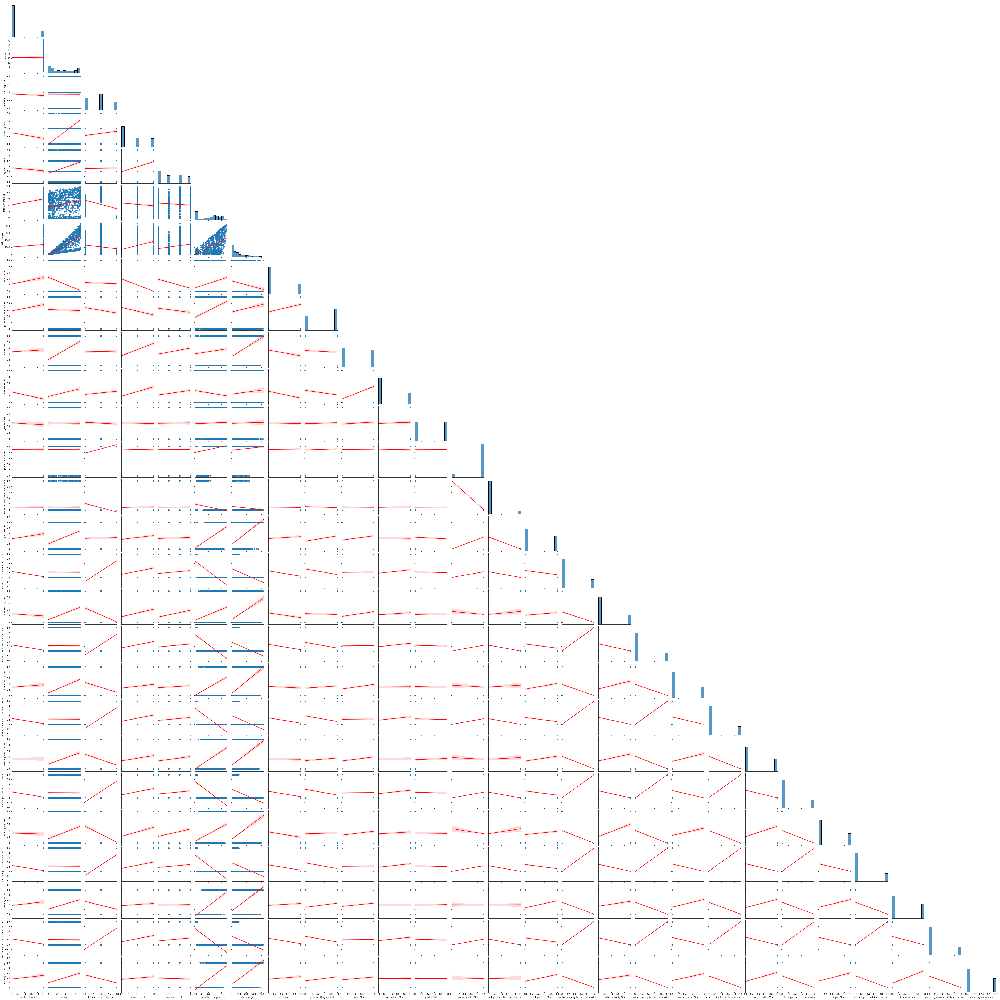

In [7]:
plot_variable_pairs(small_train)

### Months to Years

In [8]:
df = months_to_years(df)
df.head()

,customer_id,gender,senior_citizen,partner,dependents,tenure,phone_service,multiple_lines,internet_service_type_id,online_security,...,payment_type_id,monthly_charges,total_charges,churn,contract_type,internet_service_type,payment_type,has_churned,paperless_billing_numeric,tenure_years
0,0016-QLJIS,Female,0,Yes,Yes,65,Yes,Yes,1,Yes,...,2,90.45,5957.9,No,Two year,DSL,Mailed check,0,1,5
1,0017-DINOC,Male,0,No,No,54,No,No phone service,1,Yes,...,4,45.20,2460.55,No,Two year,DSL,Credit card (automatic),0,0,4
2,0019-GFNTW,Female,0,No,No,56,No,No phone service,1,Yes,...,3,45.05,2560.1,No,Two year,DSL,Bank transfer (automatic),0,0,4
3,0056-EPFBG,Male,0,Yes,Yes,20,No,No phone service,1,Yes,...,4,39.40,825.4,No,Two year,DSL,Credit card (automatic),0,1,1
4,0078-XZMHT,Male,0,Yes,No,72,Yes,Yes,1,No,...,3,85.15,6316.2,No,Two year,DSL,Bank transfer (automatic),0,1,6


### Plot Categorical and Continuous Variables

In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5453 entries, 5059 to 1177
Data columns (total 28 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   customer_id                            5453 non-null   object 
 1   senior_citizen                         5453 non-null   int64  
 2   tenure                                 5453 non-null   int64  
 3   internet_service_type_id               5453 non-null   int64  
 4   contract_type_id                       5453 non-null   int64  
 5   payment_type_id                        5453 non-null   int64  
 6   monthly_charges                        5453 non-null   float64
 7   total_charges                          5453 non-null   float64
 8   has_churned                            5453 non-null   int64  
 9   paperless_billing_numeric              5453 non-null   int64  
 10  partner_Yes                            5453 non-null   uint8  
 11  d

In [10]:
continuous_telco = ['monthly_charges', 'total_charges', 'tenure']
categorical_telco = ['senior_citizen',
              'internet_service_type_id',
              'contract_type_id', 
              'payment_type_id', 
              'has_churned', 
              'paperless_billing_numeric', 
              'partner_Yes', 
              'dependents_Yes', 
              'gender_Male',
              'phone_service_Yes', 
              'multiple_lines_No phone service', 
              'online_security_No internet service', 
              'online_security_Yes', 
              'online_backup_No internet service', 
              'online_backup_Yes', 
              'device_protection_No internet service', 
              'device_protection_No internet service', 
              'device_protection_Yes', 
              'tech_support_No internet service', 
              'tech_support_Yes', 
              'streaming_tv_No internet service', 
              'streaming_tv_Yes',
              'streaming_movies_No internet service', 
              'streaming_movies_Yes']

(<AxesSubplot:xlabel='streaming_movies_Yes', ylabel='tenure'>,
 <AxesSubplot:xlabel='streaming_movies_Yes', ylabel='tenure'>,
 <AxesSubplot:xlabel='streaming_movies_Yes', ylabel='tenure'>)

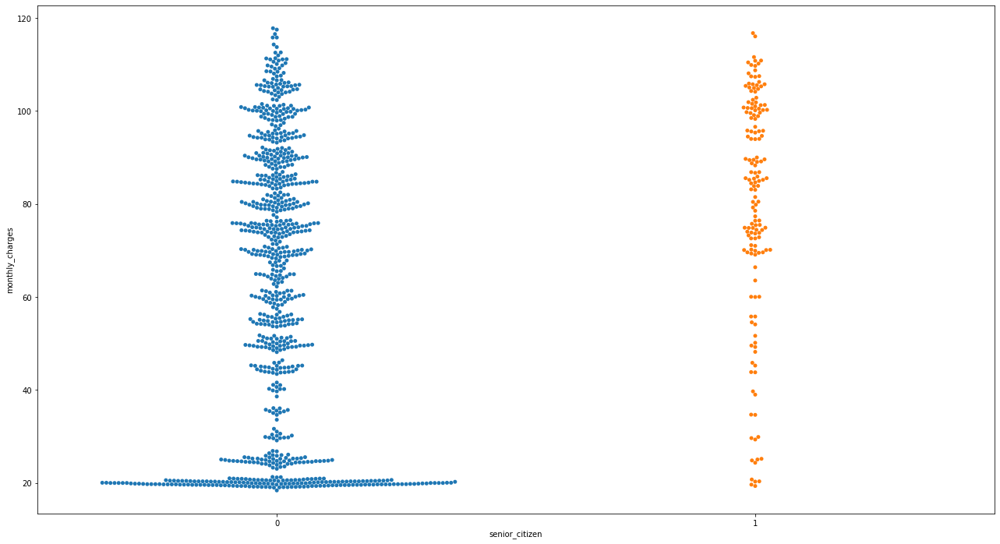

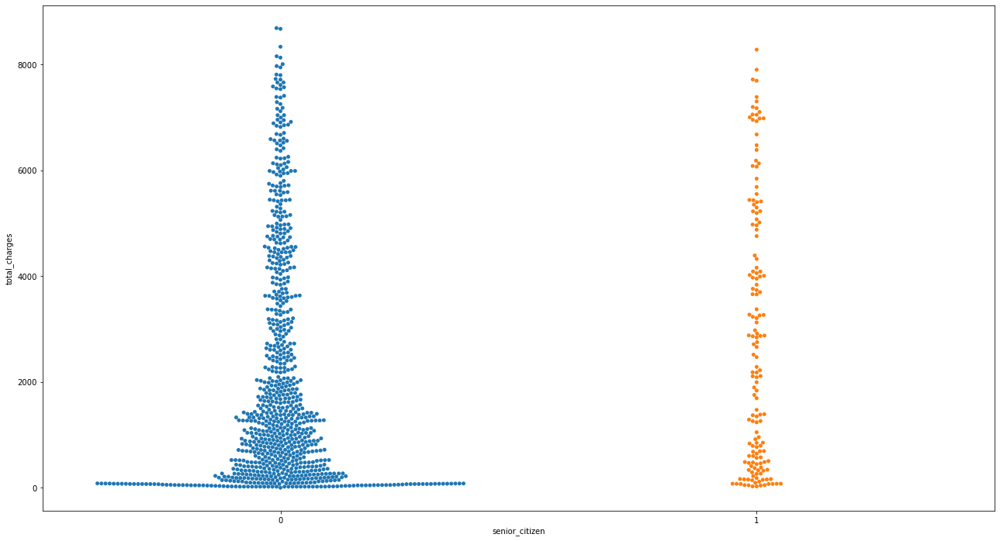

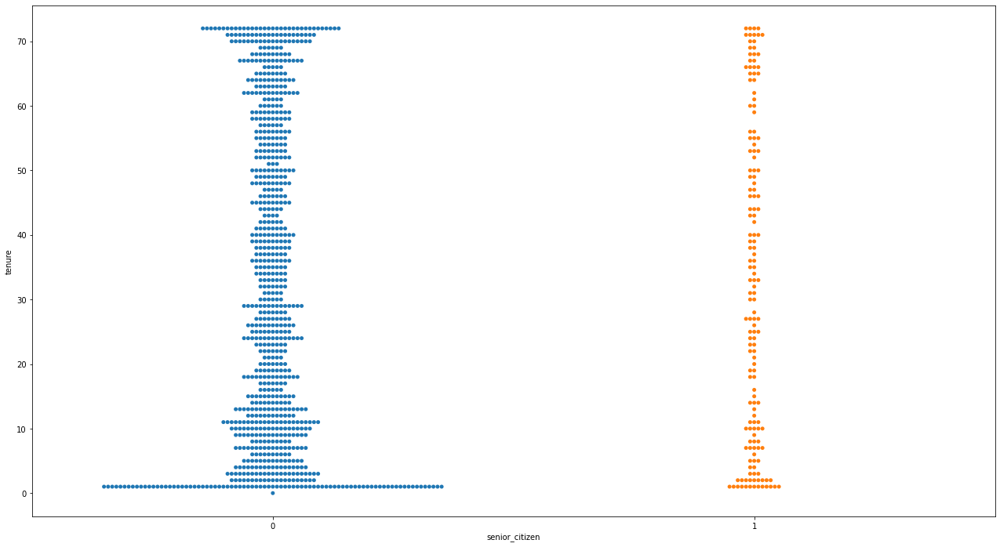

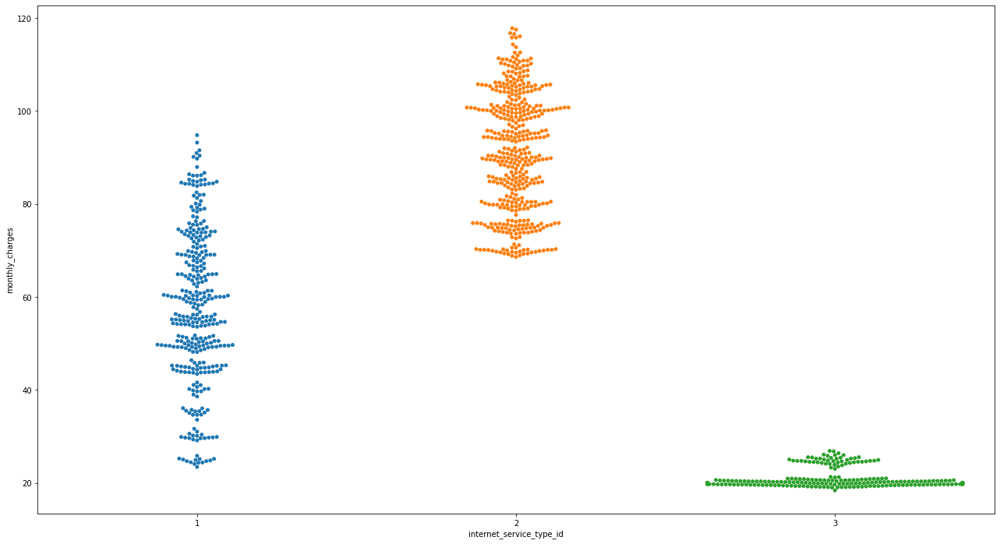

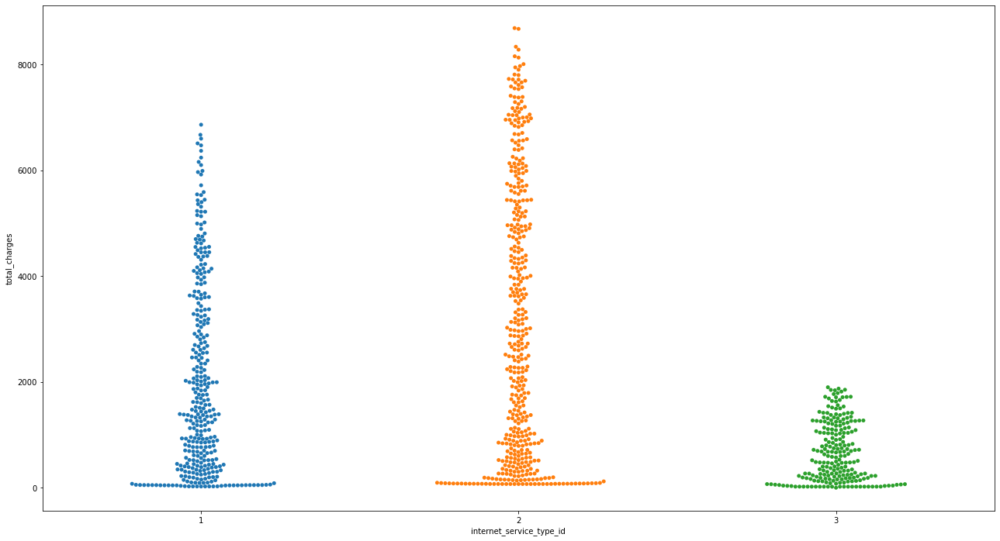

...

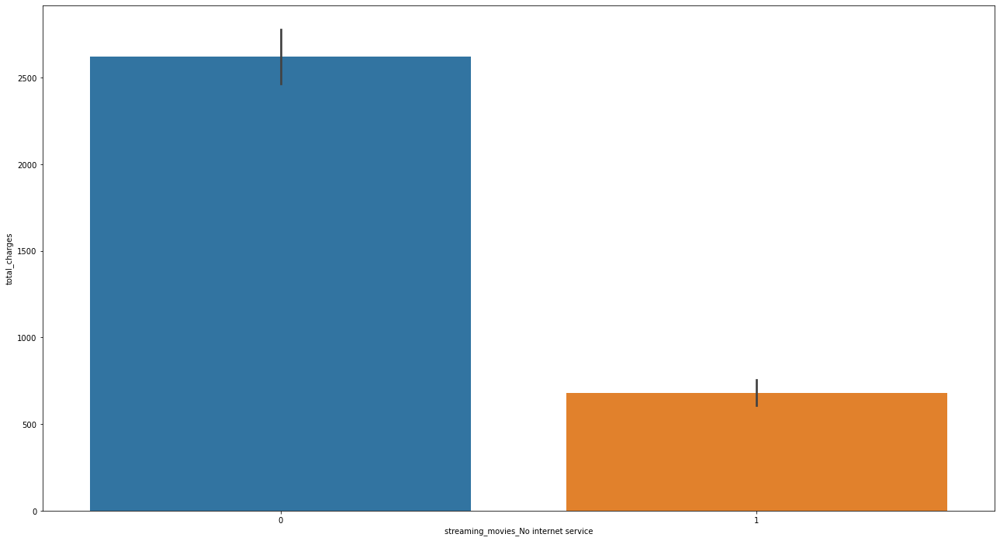

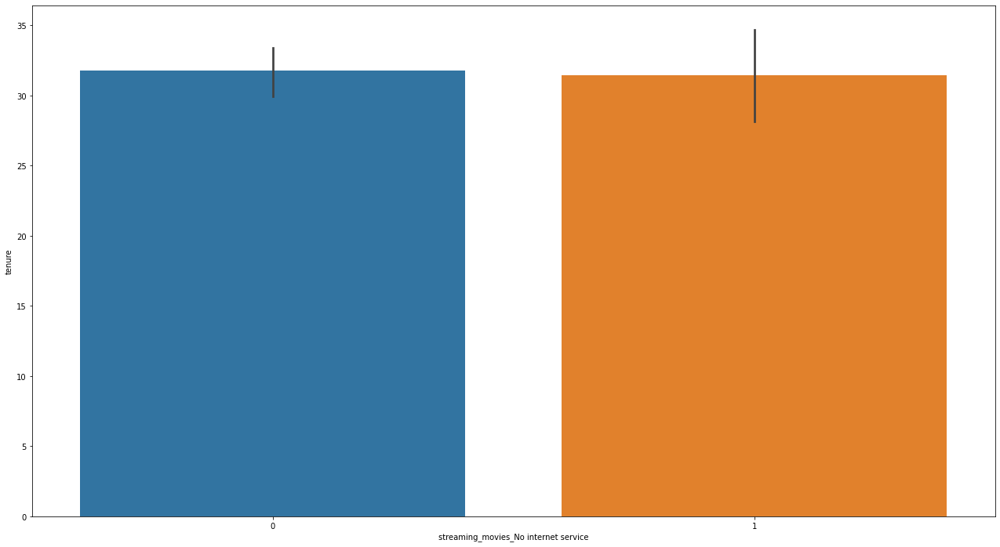

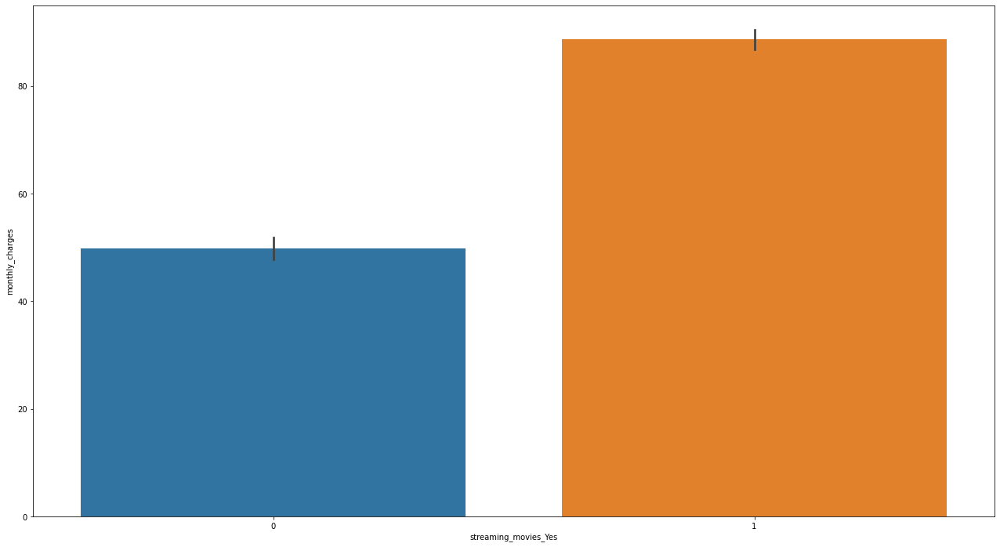

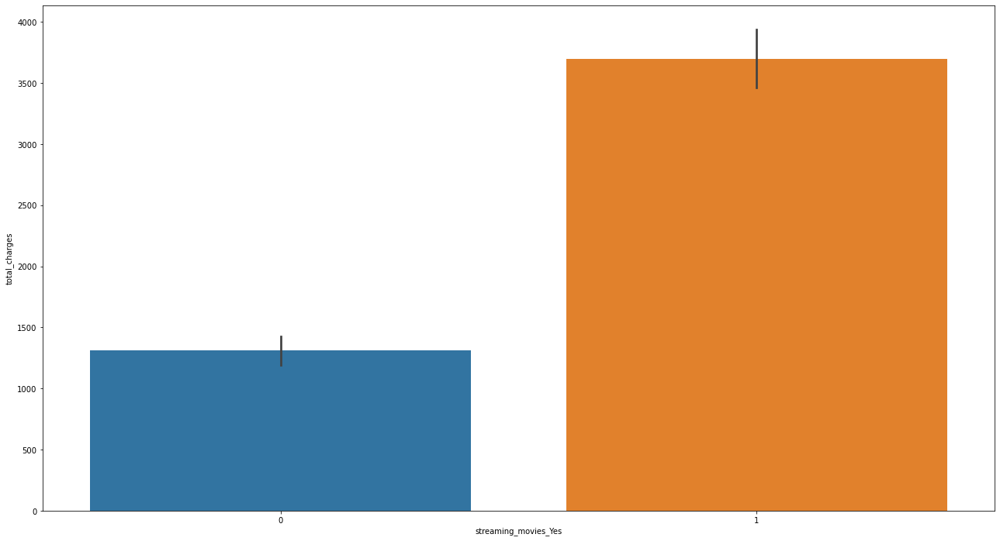

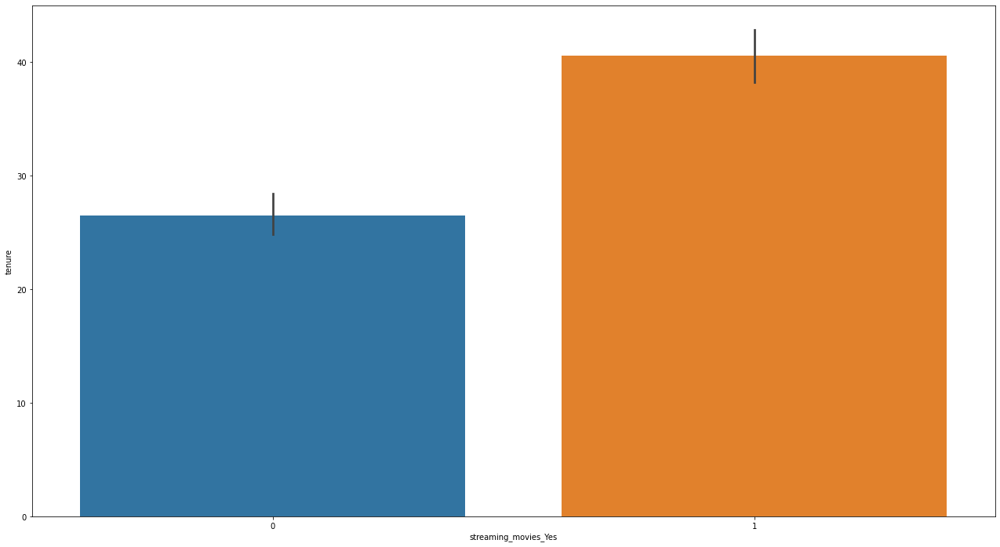

In [11]:
plot_categorical_and_continuous_vars(small_train, categorical_telco, continuous_telco)

### Other Graphs

#### Monthly charges v. Total charges

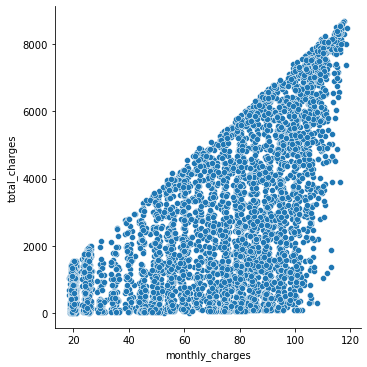

In [12]:
sns.color_palette("bright")
monthly_charges_and_total_charges = sns.relplot(data = train, x = "monthly_charges", y="total_charges")

As we can see in the graph above, there appears to be a correlation between monthly charges and total charges.

#### Total charges v. Tenure

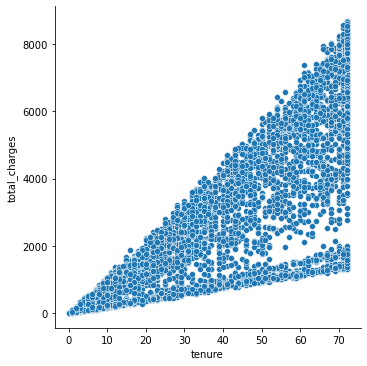

In [13]:
sns.color_palette("bright")
tenure_and_total_charges = sns.relplot(data = train, x = "tenure", y="total_charges")

Again, there appears to be a correlation between tenure and total charges.

## Zillow Data

### Acquire Data

In [14]:
df = wrangle_zillow()

In [15]:
df.head()

,bedroomcnt,bathroomcnt,calculatedfinishedsquarefeet,taxvaluedollarcnt,yearbuilt,taxamount,fips
4,4.0,2.0,3633.0,296425.0,2005.0,6941.39,6037.0
6,3.0,4.0,1620.0,847770.0,2011.0,10244.94,6037.0
7,3.0,2.0,2077.0,646760.0,1926.0,7924.68,6037.0
18,3.0,1.0,1244.0,169471.0,1950.0,2532.88,6037.0
19,3.0,2.0,1300.0,233266.0,1950.0,3110.99,6037.0


### Split Data

In [16]:
def split_data(df):
    #split data in train_and_validate_and_test
    train_and_validate, test = train_test_split(df, test_size=.12, random_state=123)
    #split train and validate datasets
    train, validate = train_test_split(train_and_validate, test_size=.12, random_state=123)

    return train, validate, test

In [17]:
train, validate, test = split_data(df)

### Scale Data

In [18]:
train, validate, test = add_scaled_columns(train, validate, test)

In [19]:
temp_df = train.head(1000)

In [20]:
temp_df.head()

,bedroomcnt,bathroomcnt,calculatedfinishedsquarefeet,taxvaluedollarcnt,yearbuilt,taxamount,fips,calculatedfinishedsquarefeet_scaled,bedroomcnt_scaled,bathroomcnt_scaled
1562981,4.0,3.0,2306.0,618000.0,1988.0,7692.16,6037.0,0.464343,0.6,0.545455
1703392,2.0,1.0,1314.0,84938.0,1951.0,1794.55,6037.0,0.264504,0.2,0.181818
1243403,4.0,3.0,2902.0,680217.0,1964.0,8313.32,6037.0,0.584408,0.6,0.545455
988579,4.0,2.5,2474.0,524060.0,1977.0,5972.20,6059.0,0.498187,0.6,0.454545
403841,3.0,2.0,1624.0,506374.0,1952.0,6290.72,6037.0,0.326954,0.4,0.363636


In [21]:
temp_df_scaled = temp_df.drop(columns = ["bedroomcnt", "bathroomcnt", "calculatedfinishedsquarefeet"])

### Pairplot

In [22]:
def plot_variable_pairs(df):
    g = sns.pairplot(df, kind="reg", corner=True, plot_kws={'line_kws':{'color':'red'}})
    return g

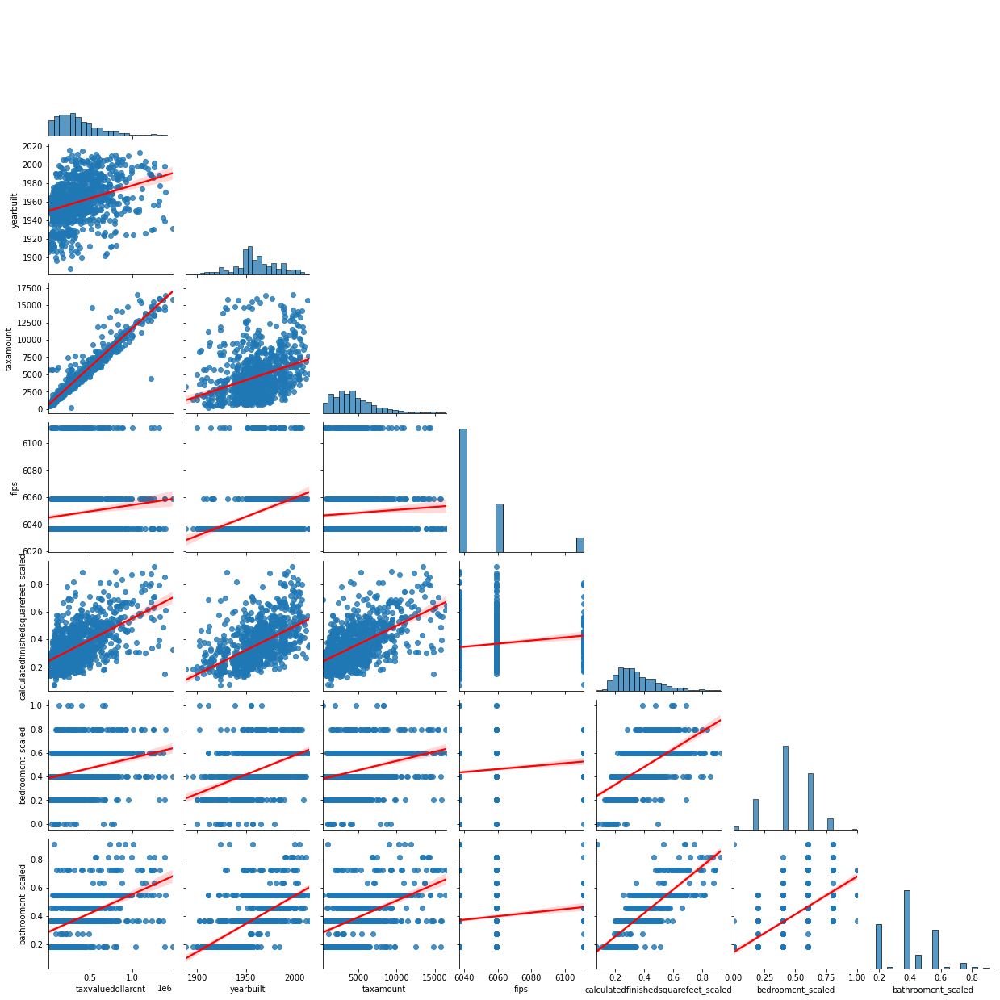

In [23]:
plot_variable_pairs(temp_df_scaled)

### Plotting Categorical vs. Continuous Features

In [24]:
categorical = ['fips', 'yearbuilt']
continuous = ['bedroomcnt_scaled', 'bathroomcnt_scaled', 'calculatedfinishedsquarefeet_scaled', 'taxvaluedollarcnt', 'taxamount']

In [25]:
def plot_categorical_and_continuous_vars(train):
    for col1 in categorical:
        for col2 in continuous:
            plt.figure(figsize=(22, 12))
            a = sns.swarmplot(x=train[col1], y=train[col2], data=train)
    for col1 in categorical:
        for col2 in continuous:
            plt.figure(figsize=(22, 12))        
            b = sns.stripplot(x=train[col1], y=train[col2], data=train)      
    for col1 in categorical:
        for col2 in continuous:
            plt.figure(figsize=(22, 12))
            c = sns.barplot(x=train[col1], y=train[col2], data=train)
    return a, b, c

In [ ]:
plot_categorical_and_continuous_vars(temp_df_scaled)

### Initial Hypothesis

For the following hypothesis, we will set our alpha value, $\alpha$, equal to $0.05$.

In [33]:
los_angeles = train[train.fips == 6037.0]
orange = train[train.fips == 6059.0]
ventura = train[train.fips == 6111.0]

#### Los Angeles County vs. Orange County

$H_0$: There is no significant difference in `taxvaluedollarcnt` for homes in Los Angeles County (FIPS code $6037$) and homes Orange County (FIPS code $6059$). 

$H_0$: There is a significant difference in `taxvaluedollarcnt` for homes in Los Angeles County (FIPS code $6037$) and homes in either Orange County (FIPS code $6059$).

In [34]:
test_results = stats.ttest_ind(los_angeles.taxvaluedollarcnt, orange.taxvaluedollarcnt)
test_results

Ttest_indResult(statistic=-195.13528434305368, pvalue=0.0)

Because our pvalue is less than our alpha of 0.05, we reject the null hypothesis and conclude there is a significant difference in home value for houses in Los Angeles vs. Orange County.

#### Los Angeles County vs. Ventura County

$H_0$: There is no significant difference in `taxvaluedollarcnt` for homes in Los Angeles County (FIPS code $6037$) and homes Ventura County (FIPS code $6111$). 

$H_0$: There is a significant difference in `taxvaluedollarcnt` for homes in Los Angeles County (FIPS code $6037$) and homes in either Ventura County (FIPS code $6111$).

In [38]:
test_results = stats.ttest_ind(los_angeles.taxvaluedollarcnt, ventura.taxvaluedollarcnt)
test_results

Ttest_indResult(statistic=-79.31447097391835, pvalue=0.0)

Because our pvalue is less than our alpha of 0.05, we reject the null hypothesis and conclude there is a significant difference in home value for houses in Los Angeles vs. Ventura County.

#### Orange County vs. Ventura County

$H_0$: There is no significant difference in `taxvaluedollarcnt` for homes in Orange County (FIPS code $6059$) and homes Ventura County (FIPS code $6111$). 

$H_0$: There is a significant difference in `taxvaluedollarcnt` for homes in Orange County (FIPS code $6059$) and homes in either Ventura County (FIPS code $6111$).

In [40]:
test_results = stats.ttest_ind(orange.taxvaluedollarcnt, ventura.taxvaluedollarcnt)
test_results

Ttest_indResult(statistic=37.807546005711586, pvalue=0.0)

Because our pvalue is less than our alpha of 0.05, we reject the null hypothesis and conclude there is a significant difference in home value for houses in Orange vs. Ventura County.